In [1]:
import numpy as np
import scipy as sp
import torch as th

import os, pdb, sys, json, glob, tqdm
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

plt.rcParams['figure.figsize'] = [10, 10]
plt.rcParams['figure.dpi'] = 200
sns.set(context='poster',
        style='ticks',
        font_scale=1,
        rc={'axes.grid':True,
            'grid.color':'.9',
            'grid.linewidth':0.75})
%load_ext autoreload
%autoreload 2

dev = 'cuda'
root = '/home/ubuntu/ext_vol'
import sys
sys.path.insert(0, f'{root}/inpca')

from utils import get_data, get_idx, get_configs, setup, get_model

In [2]:
import plotly.graph_objects as go
import numpy as np
import plotly.offline as pyo
import pandas as pd
import plotly.express as px
pyo.init_notebook_mode()

In [13]:
all_files = glob.glob('/home/ubuntu/ext_vol/inpca/results/models/synthetic-sloppy/*.p')

In [14]:
from compute_dist import dist_from_flist
dist_from_flist(all_files[:100], loc='/home/ubuntu/ext_vol/inpca/inpca_results', fn='synthetic-sloppy', loaded=False, save_didx=True)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [01:39<00:00,  1.00it/s]


torch.Size([6530, 25000, 10]) torch.Size([6530, 25000, 10])
Saving w
torch.Size([6530, 5000, 10]) torch.Size([6530, 5000, 10])
Saving w


In [3]:
def plotly_3d(dc, r, emph=[], empcolor='darkred', empsize=10, empmode='markers',
              return_text=False, return_d=False, ne=3, dims=[1, 2, 3],
              cols=['seed', 'm', 'opt', 'err', 'verr', 'bs', 'aug', 'bn', 'lr', 'wd'],
              groups = ['seed', 'm', 'opt', 'bs', 'aug', 'bn', 'lr', 'wd', 'corner'],
              color='t', cmap=None, colorscale='RdBu', mode='markers', separate_traj=False, axis_range=[-1, 1]):

    for (config, idxs) in dc.groupby(['m', 'opt', 'bs', 'aug', 'lr', 'wd']).indices.items():
        tmax = dc.iloc[idxs]['t'].max()
        dc.loc[idxs, 't'] /= tmax
    for i in range(ne):
        dc[f"x{i+1}"] = r['xp'][:, i]
    d_ = dc.copy()
        
    for col in cols:
        dc[col] = f'{col}: ' + dc[col].astype(str)
    text = dc[cols].apply("<br>".join, axis=1)
    text = 't: ' + dc['t'].astype(str) + '<br>' + text
    
    c = d_[color]
    if cmap is not None:
        c = c.map(cmap)
    size = 2 * np.ones(len(dc))

    if separate_traj:
        fig = go.Figure()
        for (i, (conds, ii)) in enumerate(list(d_.groupby(groups).indices.items())):
            dc_ = dc.iloc[ii].reset_index()
            fig.add_trace(
                go.Scatter3d(
                x=dc_[f'x{dims[0]}'],  
                y=dc_[f'x{dims[1]}'],  
                z=dc_[f'x{dims[2]}'],  
                hovertemplate='<b>%{text}</b><extra></extra>',
                text=text[ii],
                marker=dict(
                    size=2,
                    opacity=0.8,
                    color=c[ii],
                    symbolsrc='m',
                    colorscale='s',
                ),
                mode=mode,
                line=dict(
                    color=c[ii],
                    width=2,
                ),
                name=conds[-1]
            ),
                
            )
    else:
        
        fig = go.Figure(data=[
            go.Scatter3d(
                x=dc[f'x{dims[0]}'],  
                y=dc[f'x{dims[1]}'],  
                z=dc[f'x{dims[2]}'],  
                hovertemplate='<b>%{text}</b><extra></extra>',
                text=text,
                marker=dict(
                    size=2,
                    opacity=0.8,
                    color=c,
                    symbolsrc='m',
                    colorscale=colorscale,
                ),
                mode='markers',
            )
        ])
        if len(emph) > 0:
            for ie in emph:
                demph = dc.iloc[ie]
                fig.add_trace(
                go.Scatter3d(
                    x=demph[f'x{dims[0]}'],  
                    y=demph[f'x{dims[1]}'],  
                    z=demph[f'x{dims[2]}'],  

                    marker=dict(
                        size=empsize,
                        opacity=0.8,
                        color=empcolor,
                    ),
                    mode=empmode,
                    )
                )
    fig.update_layout(
        autosize=False,
        width=1000,
        height=1000,
        scene_xaxis_range=axis_range,
    scene_yaxis_range=axis_range,
    scene_zaxis_range=axis_range,
    scene_aspectmode='cube')

    print(r['e'])

    results = [fig]
    if return_text: 
        results.append(text)
    if return_d:
        results.append(d_)
    return results

def plotly_2d(dc, text, ne=3):
    fig = go.Figure(data=go.Splom(
                dimensions=[dict(label=f'x{i}',
                                 values=dc[f'x{i}']) for i in range(1, ne+1)],
                showupperhalf=False, # remove plots on diagonal
                diagonal_visible=False,
                text=text,
                marker=dict(color=dc.t,
                            showscale=False, # colors encode categorical variables
                            line_color='white', size=2, opacity=0.8)
                ), )


    fig.update_layout(
        autosize=False,
        width=1000,
        height=1000
    )

    fig.show()
    
def triplot(dc, r, d=3, emph=[], cmap='vlag', cdict=None, ckey='', skey='', sdict={},
            markers=["o", "x", "s", "*", "+"],
            evals=False, plot_avg=False, avggroupby=['opt'], plot_lines=False,
            xrange=[-1, 1], yrange=[-1, 1]
            ):
    figs, axs = plt.subplots(d-1, d-1, figsize=(12, 12),
                            sharex=True, sharey=True)
    ee = r['e']
    c = dc[ckey]
    if skey:
        s = dc[skey]
    else:
        s = 2
        
    if cdict:
        c = c.fillna('nan')
        c = c.map(cdict)
        print(cdict)  
   

    for (i1, d1) in enumerate(range(d-1)):
        for (i2, d2) in enumerate(range(d1+1, d)):
            if d2 > d1 + 1:
                axs[d1, d2-1].set_visible(False)
            ax = axs[d2-1, d1]
            ax.axis("square")

            xx = r['xp']
            sc = ax.scatter(xx[:, d1], xx[:, d2],
                            c=c, cmap=cmap, vmin=c.min(), vmax=c.max(), s=s, lw=0.5, alpha=0.5)
            if len(emph) > 0:
                sc_emph = ax.scatter(xx[emph, d1], xx[emph, d2],
                            c='red', s=s+10, lw=0.5, alpha=0.5)
            ax.set_xlim(xrange)
            ax.set_ylim(yrange)
            if plot_lines:
                config_cols = ['seed', 'm', 'opt', 'bs', 'aug', 'bn', 'lr', 'wd']
                config_cols.remove(key)
                dc_ = dc.iloc[ii]
                for (c, ii_) in dc_.groupby(config_cols).indices.items():
                    xx_ = xx[ii_]
                    print(dc_.iloc[ii_]['t'])
                    _ = sns.lineplot(x=xx_[:, d1], y=xx_[:, d2], ax=ax, legend=False, lw=0.2)

                #                 sc = ax.plot(xx[:, d1], xx[:, d2], label=k, lw=0.5)
            if ee[d1] < 0:
                ax.spines['bottom'].set_color('red')
            if ee[d2] < 0:
                ax.spines['left'].set_color('red')
            ax.set_xlabel(f'pc{d1+1}')
            ax.set_ylabel(f'pc{d2+1}')
            if plot_avg:
                iavg = get_idx(dc, f't >= 0 & seed == -1')
                for (k, v) in dc.iloc[iavg].groupby(avggroupby).indices.items():
                    avg_ms = r['xp'][v]
                    avg = sns.lineplot(x=avg_ms[:, d1], y=avg_ms[:, d2],
                                       label=k, ax=ax, legend=False, lw=1.0)
    handles, labels = ax.get_legend_handles_labels()
    if evals:
        ax = figs.add_subplot(d-1, d-1, 2)
        ax.set_yscale('log')
        ax.grid()
        w = 0.5
        for e in ee:
            ax.plot((-w/4, w/4), (np.abs(e), np.abs(e)),
                    c='k' if e > 0 else 'r')
        ax.set_xlim([-w/2, w/2])
        ax.get_xaxis().set_visible(False)

    ax = axs[0, -1]
    clb = plt.colorbar(sc, pad=0.2, ax=ax)
    clb.ax.set_title(ckey)
    ax = axs[0, -1]
    ax.legend(handles, labels, loc='lower center')
    plt.show()

### Synthetic Data

In [3]:
didx = th.load('/home/ubuntu/ext_vol/inpca/inpca_results/didx_yh_synthetic.p')['dc']
w = th.load('/home/ubuntu/ext_vol/inpca/inpca_results/w_yh_synthetic.p')

In [7]:
ii = get_idx(didx, "opt != 'adam'")
didx = didx.iloc[ii].reset_index(drop=True)
w = w[:, ii][ii, :]
print(len(didx))

4610


In [4]:
from embed import proj_
l = np.eye(w.shape[0]) - 1.0/w.shape[0]
w = -l @ w @ l / 2
r = proj_(w, w.shape[0], 3)
r['fn'] = np.linalg.norm(w, ord='fro')

Projecting


In [5]:
for (c, ii) in didx.groupby(['seed', 'm','opt','bs','aug','lr','wd']).indices.items():
    tmax = didx.iloc[ii].t.max()
    didx.loc[ii, 't'] /= tmax

In [8]:
fig = plotly_3d(didx, r, emph=[get_idx(didx, "t==0")], empcolor='darkred', empsize=8, empmode='markers',
              return_text=False, return_d=False, ne=3, dims=[1, 2, 3],
              cols=['seed', 'm', 'opt', 'err', 'verr', 'bs', 'aug', 'lr', 'wd'],
              groups = ['seed', 'm', 'opt', 'bs', 'aug', 'lr', 'wd'],
              color='t', cmap=None, colorscale='RdBu', mode='markers', separate_traj=False, axis_range=[-5, 5])[0]
fig.show()

0       0.00000
1       0.00002
2       0.00126
3       0.00250
4       0.00374
         ...   
6525    0.75500
6526    0.83000
6527    0.90500
6528    0.98000
6529    1.00000
Name: t, Length: 6530, dtype: float64
[ 41533.9189238   39649.41701162  35228.08715066  33393.59722113
 -26601.00830071  -5485.88048061  -4866.51387708  -4311.23527065
  -4048.23037429]


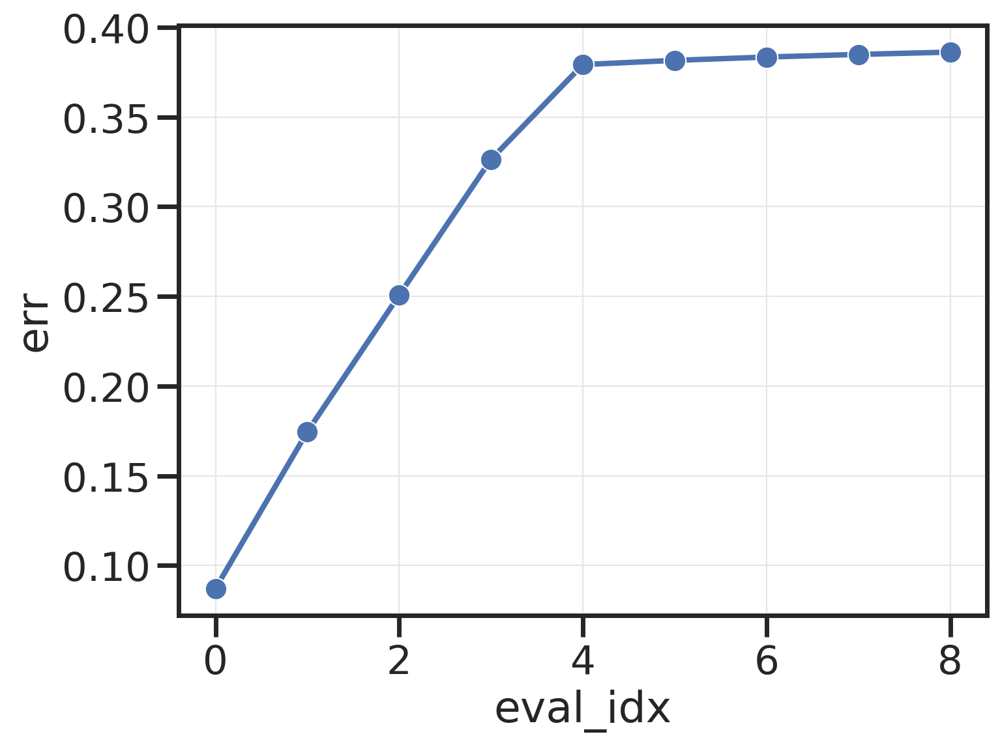

In [9]:
es = r['e']
fn = r['fn']
df = pd.DataFrame(dict(eval_idx=np.arange(len(es)), err=1 - np.sqrt(1-np.cumsum(es ** 2)/fn**2)))
plt.figure(figsize=(8,6))
g=sns.lineplot(data=df, x='eval_idx', y='err', marker="o")

/tmp/ipykernel_4345/3261970261.py:197: MatplotlibDeprecationWarning:

Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.



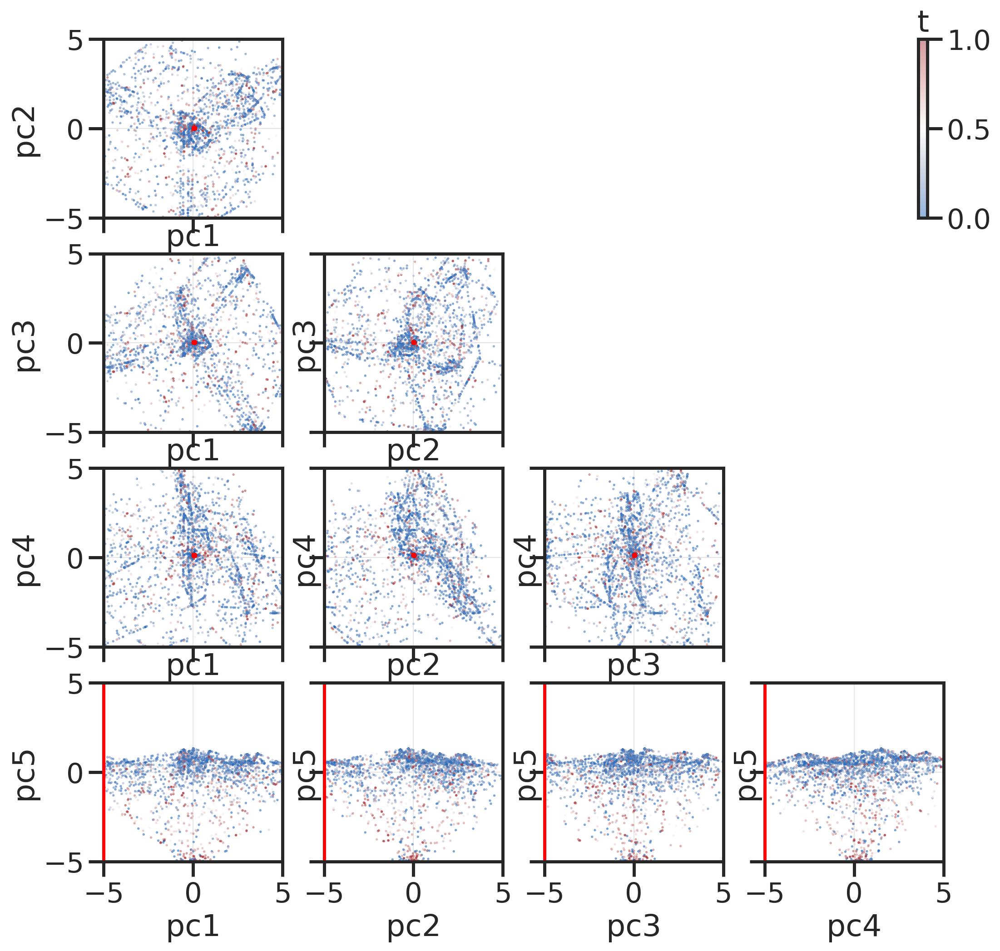

In [10]:
triplot(didx.reset_index(drop=True), r, emph=[get_idx(didx, "t==0")], d=5, cmap='vlag', cdict=None, ckey='t', 
            markers=["o", "x", "s", "*", "+"],
            evals=False, plot_avg=False, xrange=[-5, 5], yrange=[-5, 5]
            )

### Sloppy Data

In [4]:
didx = th.load('/home/ubuntu/ext_vol/inpca/inpca_results/didx_yh_synthetic-sloppy.p')['dc']
w = th.load('/home/ubuntu/ext_vol/inpca/inpca_results/w_yh_synthetic-sloppy.p')

In [5]:
from embed import proj_

l = np.eye(w.shape[0]) - 1.0/w.shape[0]
w = -l @ w @ l / 2
r = proj_(w, w.shape[0], 3)
r['fn'] = np.linalg.norm(w, ord='fro')

Projecting


In [20]:
fig = plotly_3d(didx, r, emph=[get_idx(didx, "t==0")], empcolor='darkred', empsize=8, empmode='markers',
              return_text=False, return_d=False, ne=3, dims=[1, 2, 3],
              cols=['seed', 'm', 'opt', 'err', 'verr', 'bs', 'aug', 'lr', 'wd'],
              groups = ['seed', 'm', 'opt', 'bs', 'aug', 'lr', 'wd'],
              color='t', cmap=None, colorscale='RdBu', mode='markers', separate_traj=False, axis_range=[-5, 5])[0]
fig.show()

0       0.00000
1       0.00002
2       0.00126
3       0.00250
4       0.00374
         ...   
6525    0.75500
6526    0.83000
6527    0.90500
6528    0.98000
6529    1.00000
Name: t, Length: 6530, dtype: float64
[-2030.04824312  1651.07568339  1108.77687355   635.56969297
  -328.89005775   304.02264161  -238.08620485  -103.09627891
   -99.53741734]


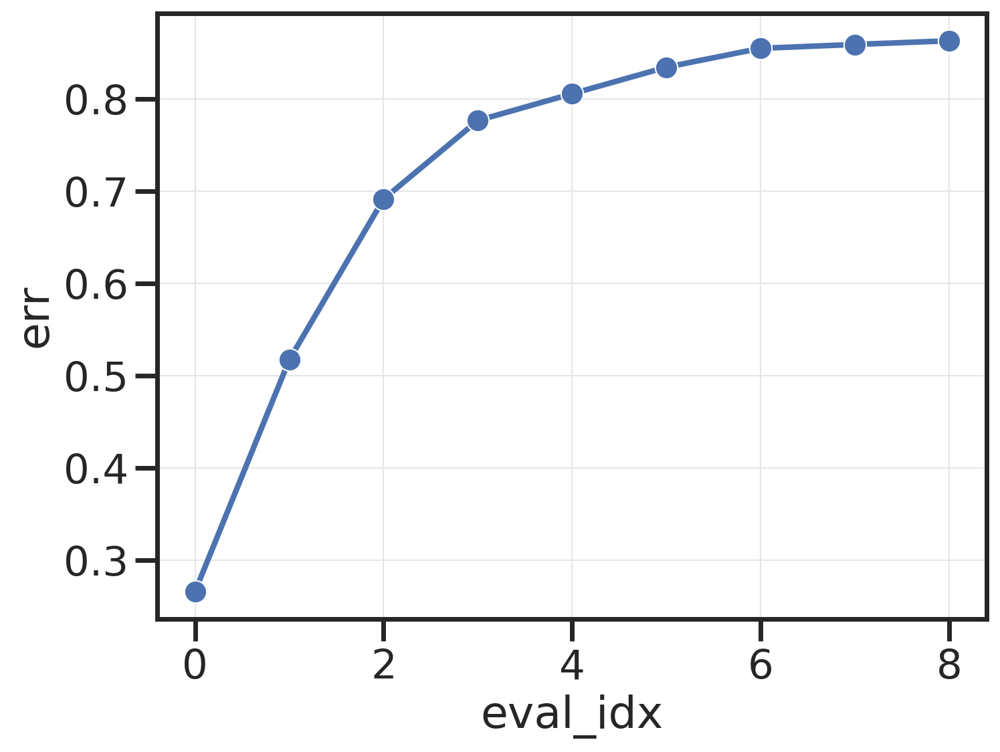

In [18]:
df = pd.DataFrame(dict(eval_idx=np.arange(len(r['e'])), err=1 - np.sqrt(1-np.cumsum(r['e'] ** 2)/r['fn']**2)))
plt.figure(figsize=(8,6))
g=sns.lineplot(data=df, x='eval_idx', y='err', marker="o")

In [21]:
didx.columns

Index(['seed', 'm', 'opt', 't', 'err', 'verr', 'bs', 'aug', 'lr', 'wd', 'x1',
       'x2', 'x3'],
      dtype='object')

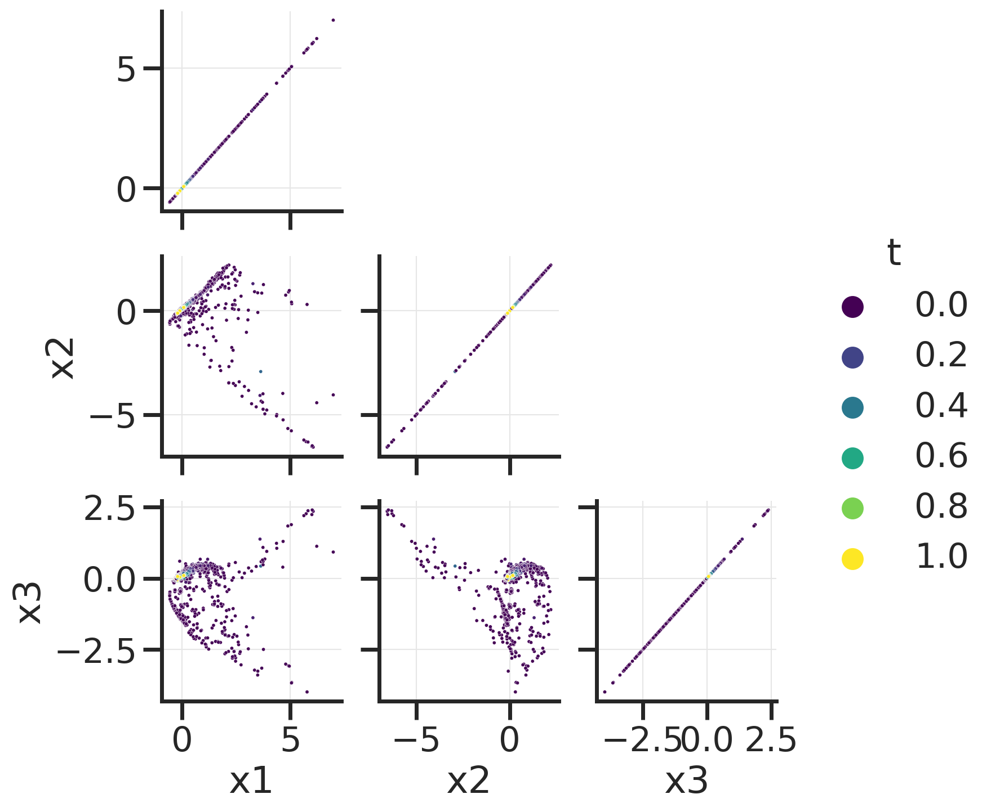

In [22]:
sns.pairplot(data=didx,  x_vars=["x1", "x2", "x3"],
    y_vars=["x1", "x2", "x3"], hue='t', corner=True, diag_kind=None, plot_kws={"s": 5}, palette='viridis')